Загрузим все ненужные библиотеки и модули:

In [1]:
from skimage.io import imread, imshow, imsave
from skimage import img_as_float, img_as_ubyte, color
from scipy.signal import convolve2d
from skimage.color import rgb2gray, gray2rgb
from scipy.fft import fft2, fftshift, ifft2, ifftshift
import numpy as np
from skimage import filters

D:\anaconda\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,


"
1. Подготовьте одно изображение для экспериментов с гауссовской и лапласовской пирамидой.

2. (5 баллов) Постройте гауссовскую пирамиду изображения из не менее чем пяти слоев. Визуализируйте полученные изображения и амплитуды частот изображений пирамиды (код можно найти в видео про преобразование Фурье) и убедитесь, что на каждом слое диапазон частот сужается.
                              "

Подготовим следующее изображение (явно содержащее высокие пространственные частоты):

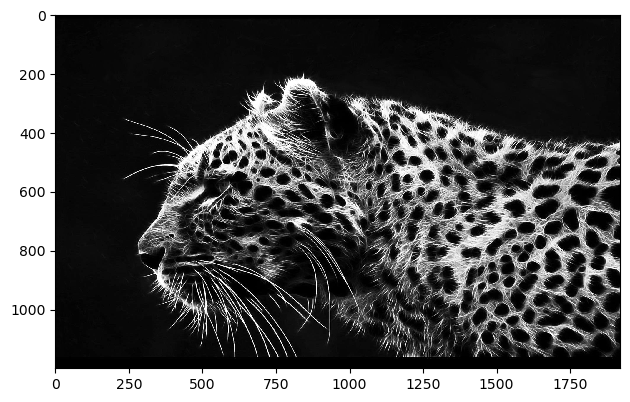

In [2]:
img = imread('C:/Users/Drozdov/Downloads/step1.jpg')
img=img_as_float(rgb2gray(img)) # переведём изображение в область float во избежание возможной потери точности (это необязательно)
imshow(img)

D:\anaconda\Lib\site-packages\skimage\io\_plugins\matplotlib_plugin.py:149: UserWarning: Float image out of standard range; displaying image with stretched contrast.
  lo, hi, cmap = _get_display_range(image)


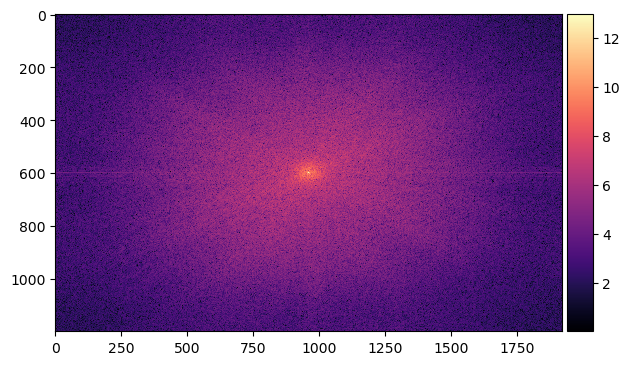

In [3]:
# по готовой и приведённой в курсе формуле применим быстрое преобразование Фурье к нашему изображению и выведем изображение спектра
freq = np.log(1 + abs(fftshift(fft2(img))))
imshow(freq, cmap='magma')

Как мы видим - высоких частот довольно много (если кажется, что мало, то можно сменить изображение и повторить всё до этого пункта).

Далее построим требуемую в п.2 задания функцию, строящую гауссовскую пирамиду. Назовём эту функцию "step1":

In [4]:
def step1(img, sigma, n_layers):
    spis, freq = [], []
    freq.append(np.log(1 + abs(fftshift(fft2(img)))))
    spis.append(img)
    for i in range(1, n_layers):
        layi = filters.gaussian(spis[i-1], sigma)
        spis.append(layi)
        freqi = np.log(1 + abs(fftshift(fft2(layi))))
        freq.append(freqi)
    return spis, freq

Выведем результат построенной по заданию функции с параметрами img (изображение, по которому строится пирамида), sigma (параметр гауссовского ядра), n_layers (количество слоев пирамиды):

In [5]:
img = img
n_layers = 8
sigma = 1
spis, freq = step1(img, sigma, n_layers)

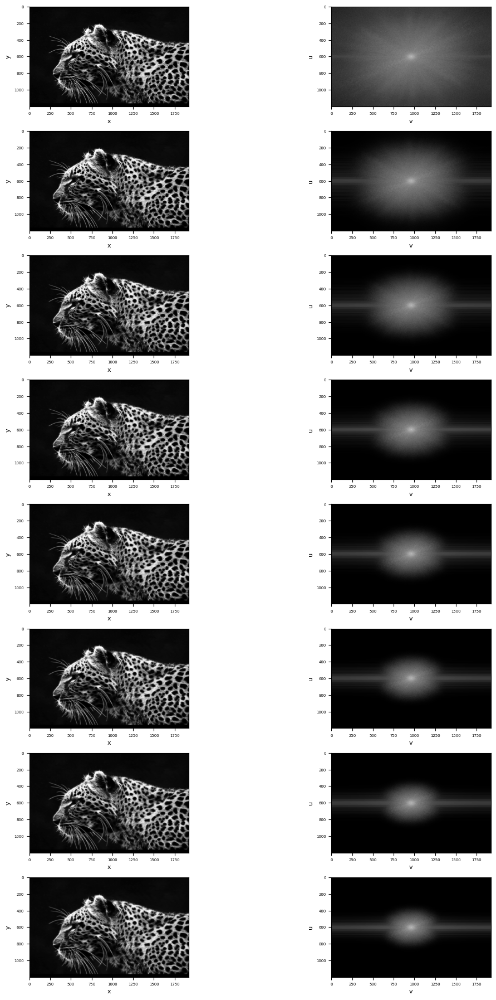

In [6]:
from matplotlib import pyplot as plt

def demonstration(img, freq):
    fig, axes = plt.subplots(nrows=n_layers, ncols=2, figsize=(11, 18))
    fig.tight_layout()
    for i in range((n_layers-1)*(len(img)!=n_layers) + (n_layers)*(len(img)==n_layers)):
        axes[i, 0].imshow((img[i]), cmap='gray')
        axes[i, 0].tick_params(axis='x', labelsize=5)
        axes[i, 0].set_xlabel('x', fontsize=8)
        axes[i, 0].set_ylabel('y', fontsize=8)
        axes[i, 0].tick_params(axis='y', labelsize=5)
        axes[i, 1].imshow((freq[i]), cmap='gray')
        axes[i, 1].set_xlabel('v', fontsize=8)
        axes[i, 1].tick_params(axis='x', labelsize=5)
        axes[i, 1].set_ylabel('u', fontsize=8)
        axes[i, 1].tick_params(axis='y', labelsize=5)
# fig.patch.set_facecolor('#ececec')

demonstration(spis, freq)

Как мы видим из полученной иллюстрации - одновременно с размытием изображения (слева) явно сужение диапазона частот (справа)

 Сделаем паузу и отдохнём...

zzZzzZzzZZZ....zzZzzZzzZZZ....zzZzzZzzZZZ

3. (5 баллов) Проведите аналогичные эксперименты с лапласовской пирамидой. Функция для построения лапласовской пирамиды должна использовать функцию построения гауссовской пирамиды и иметь, как и функция гауссовской пирамиды, параметры img, sigma и n_layers.

In [7]:
def step3(img, sigma, n_layers):
    spis, freq = step1(img, sigma, n_layers)
    spis2, freq2 = [], []
    for i in range(0, n_layers-1):
        layi = spis[i] - spis[i+1]
        spis2.append(layi)
        freqi = freq[i] - freq[i+1]
        freq2.append(freqi)
        if i == n_layers-2:
            spis2.append(spis[i+1])
            freq2.append(freq[i+1])
    return spis2, freq2

Выведем результат построенной по заданию функции с параметрами img (изображение, по которому строится пирамида), sigma (параметр гауссовского ядра), n_layers (количество слоев пирамиды):

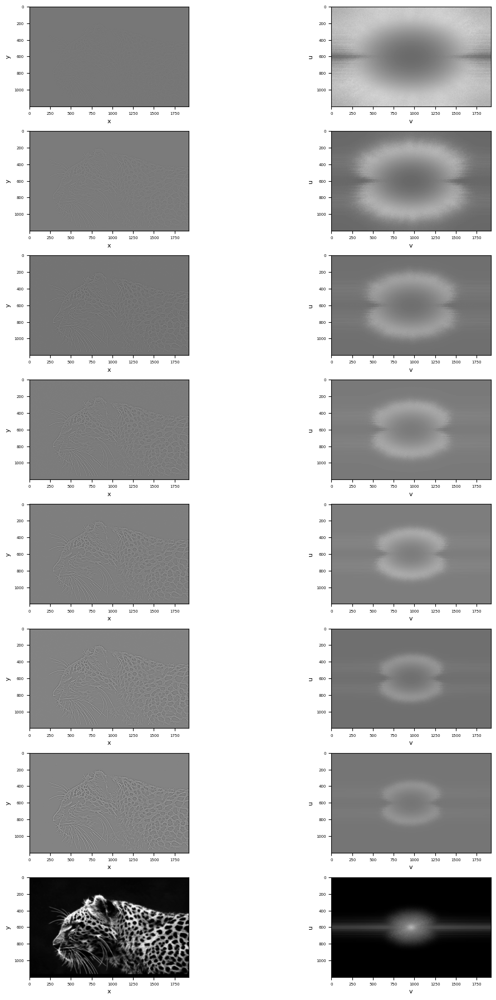

In [8]:
spis2, freq2 = step3(img, sigma, n_layers)
demonstration(spis2, freq2)

Напишем и проверим функцию склейки дапласовской пирамиды и исходное положение

In [9]:
def sintetic(imlist, freqlist):
    Im = sum(imlist)
    Freq = sum(freqlist)
    return np.clip(Im, 0, 1), Freq
    

In [10]:
Leo, Leofreq = sintetic(spis2, freq2)

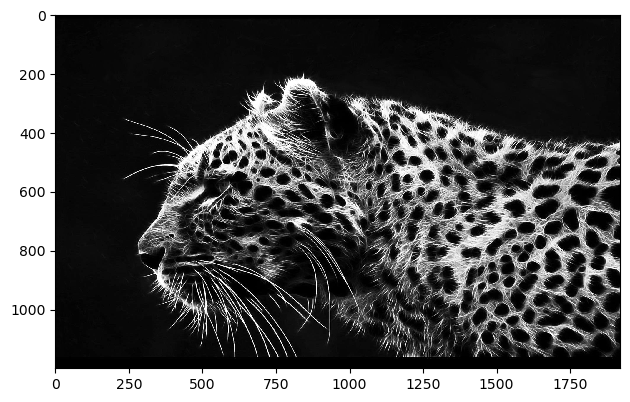

In [11]:
imshow(Leo)

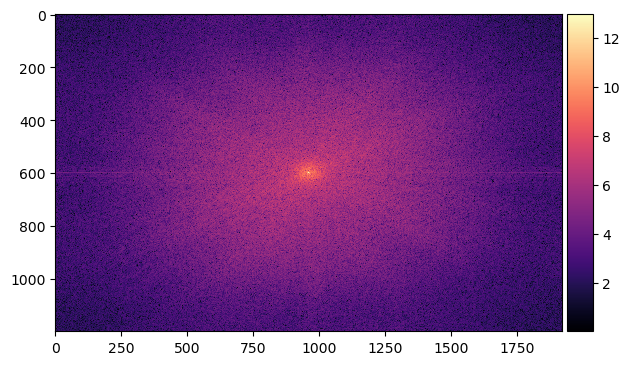

In [12]:
imshow(Leofreq, cmap='magma')

4. (5 баллов) На основе функций построения гауссовской и лапласовской пирамиды напишите функцию склейки двух изображений на основе маски. Функция должна возвращать склееные изображения и промежуточные результаты — склееные изображения разных частот (т.е. лапласовскую пирамиду совмещенного изображения). Изображения для тестирования: a.png, b.png, mask.png. Изображение с маской не является бинарным (т.е. имеет промежуточные градации серого), его можно бинаризовать путём сравнения всех элементов с порогом 128:

mask = imread('mask.png')
mask = (mask > 128).astype('uint')
 

In [13]:
img_a = img_as_float( rgb2gray(imread('C:/Users/Drozdov/Downloads/a.png')))
img_b = img_as_float( rgb2gray(imread('C:/Users/Drozdov/Downloads/b.png')))
img_mask = img_as_float( rgb2gray(imread('C:/Users/Drozdov/Downloads/mask.png')))
img_mask = ((img_mask>0.49).astype('float'))

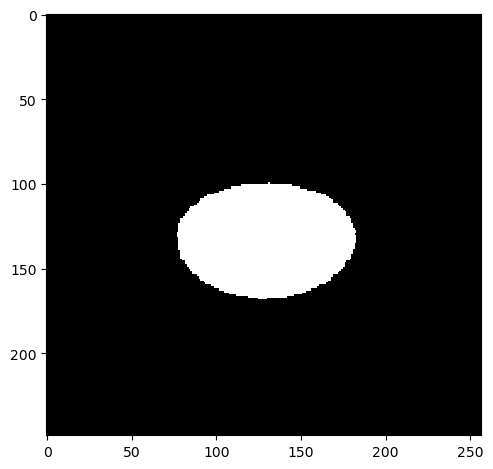

In [14]:
imshow( img_mask)

In [15]:
img_a_spis, img_a_freq = step1(img_a, sigma, n_layers)
img_b_spis, img_b_freq = step1(img_b, sigma, n_layers)

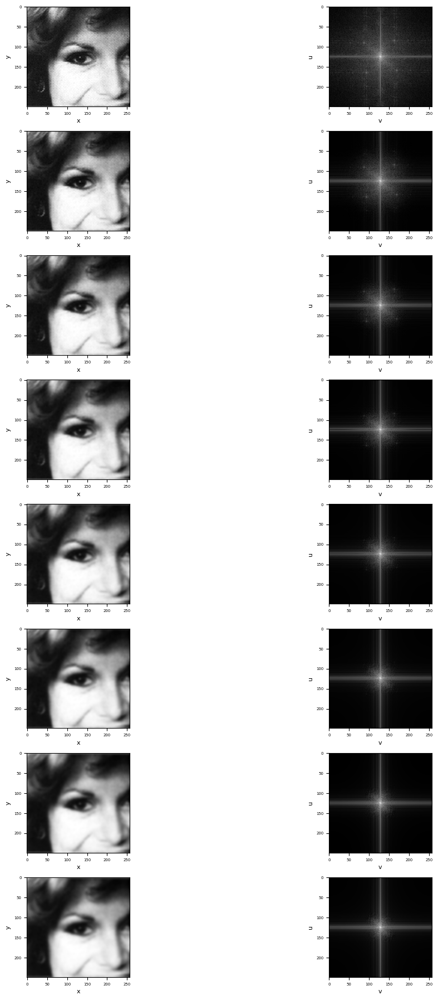

In [16]:
demonstration(img_a_spis, img_a_freq)

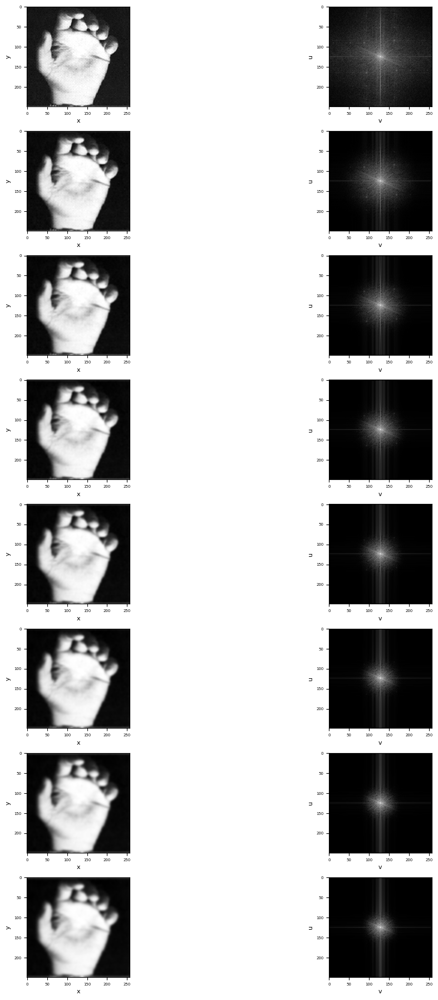

In [17]:
demonstration(img_b_spis, img_b_freq)

Строим лапласовские пирамиды

In [18]:
img_a_delta, img_a_lapl = step3(img_a, sigma, n_layers)
img_b_delta, img_b_lapl = step3(img_b, sigma, n_layers)

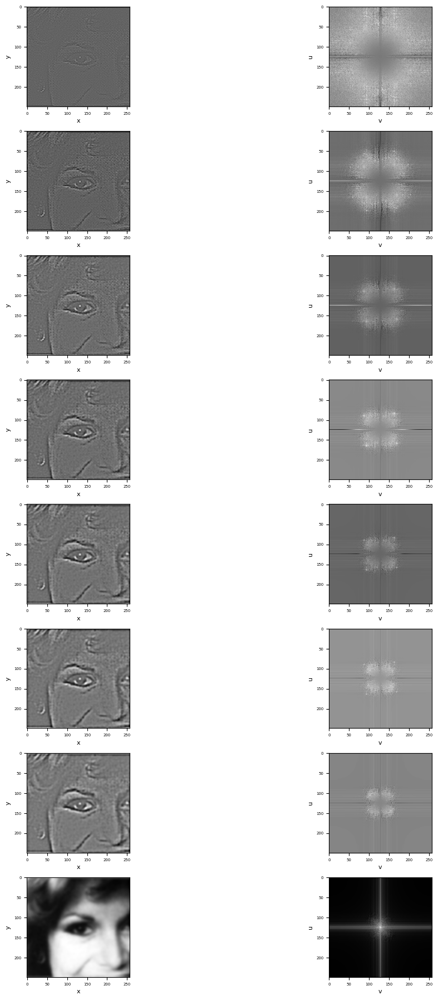

In [19]:
demonstration(img_a_delta, img_a_lapl)

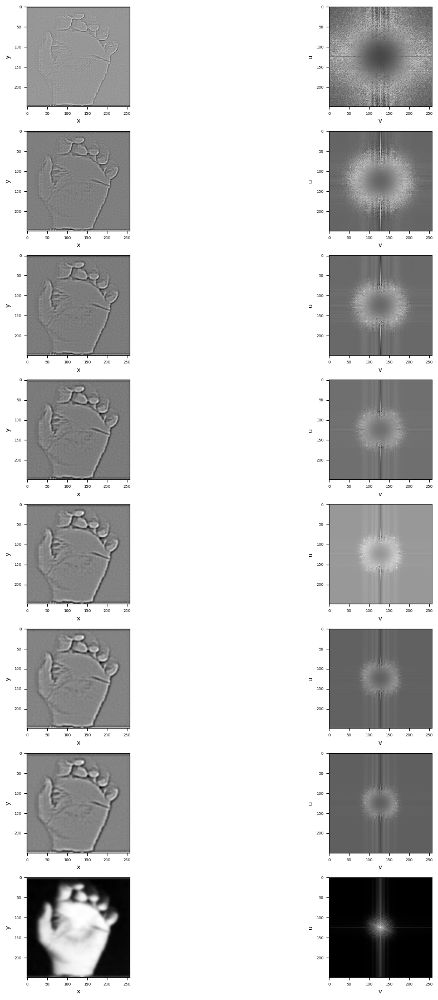

In [20]:
demonstration(img_b_delta, img_b_lapl)

# Строим гауссовскую пирамиду для маски

Переведём во float и ещё раз посмотрим на неё:

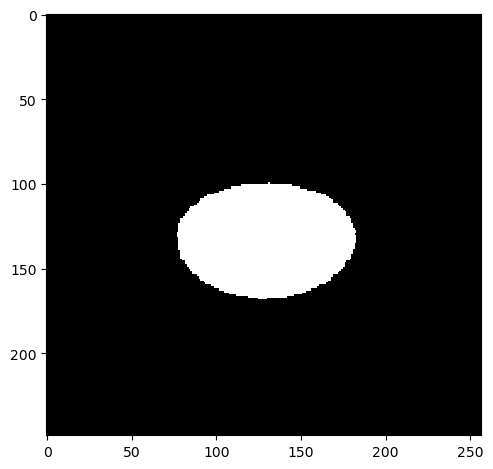

In [21]:
# img_mask = img_as_float(img_mask)
imshow(img_mask)

И теперь построим гауссовскую пирамиду для этой маски:

In [22]:
sigma_mask = 10
n_layers_mask = n_layers
img_mask_spis, img_mask_freq = step1(img_mask, sigma_mask, n_layers_mask)

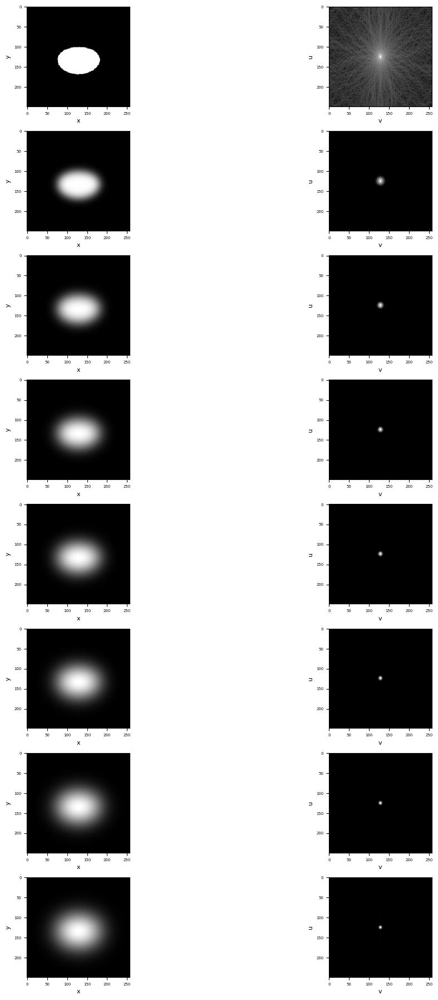

In [23]:
demonstration(img_mask_spis, img_mask_freq)

In [24]:
GM = np.array(img_mask_spis)
LA = np.array(img_a_delta)
LB = np.array(img_b_delta)
LS = GM*LA + (1-GM)*LB

Суммируем слои:

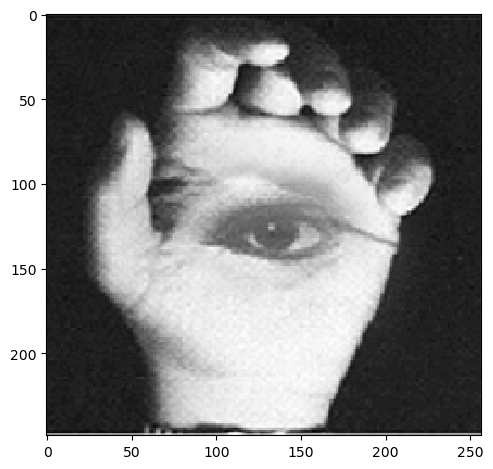

In [25]:
LSsum = sum(LS)
imshow(LSsum)

Подготовим 2 цветное изображение:


In [26]:
spring = img_as_float((imread('C:/Users/Drozdov/Downloads/spring.jpg')))
summer = img_as_float((imread('C:/Users/Drozdov/Downloads/summer.jpg')))

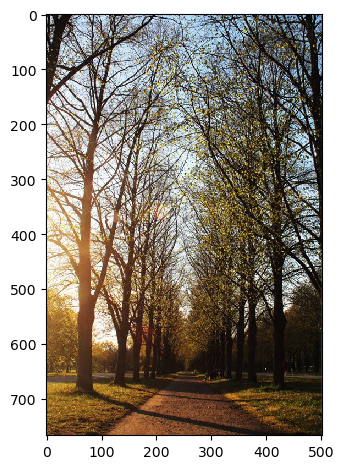

In [27]:
imshow(spring)

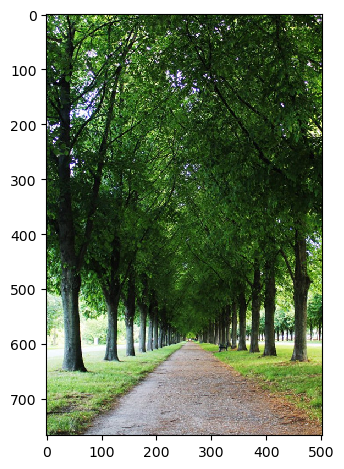

In [28]:
imshow(summer)

И вот такую маску:

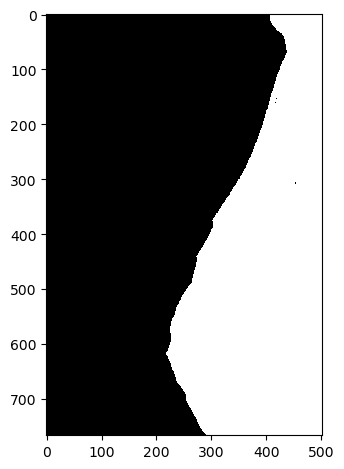

In [29]:
seasonmask = img_as_float((imread('C:/Users/Drozdov/Downloads/seasonmask.jpg')))
seasonmask = ((seasonmask>0.49).astype('float'))
imshow(seasonmask)

In [30]:
springch = [spring[:,:,i] for i in [0,1,2]]
summerch = [summer[:,:,i] for i in [0,1,2]]
springch_delta_R, springch_lapl_R = step3(springch[0], sigma, n_layers)
summerch_delta_R, summerch_lapl_R = step3(summerch[0], sigma, n_layers)
springch_delta_G, springch_lapl_G = step3(springch[1], sigma, n_layers)
summerch_delta_G, summerch_lapl_G = step3(summerch[1], sigma, n_layers)
springch_delta_B, springch_lapl_B = step3(springch[2], sigma, n_layers)
summerch_delta_B, summerch_lapl_B = step3(summerch[2], sigma, n_layers)
sigma_seasonmask = 10
n_layers_seasonmask = n_layers
seasonmask_spis, seasonmask_freq = step1(seasonmask, sigma_mask, n_layers_mask)
GM1 = np.array(seasonmask_spis)
LA_R = np.array(springch_delta_R)
LB_R = np.array(summerch_delta_R)
LA_G = np.array(springch_delta_G)
LB_G = np.array(summerch_delta_G)
LA_B = np.array(springch_delta_B)
LB_B = np.array(summerch_delta_B)
LS_R = sum(GM1*LA_R + (1-GM1)*LB_R)
LS_G = sum(GM1*LA_G + (1-GM1)*LB_G)
LS_B = sum(GM1*LA_B + (1-GM1)*LB_B)
[LS_R, LS_G, LS_B] = [(i - i.min())*1 for i in [LS_R, LS_G, LS_B]]
[LS_R, LS_G, LS_B] = [i/i.max() for i in [LS_R, LS_G, LS_B]]
[LS_R, LS_G, LS_B] = [img_as_ubyte(i) for i in [LS_R, LS_G, LS_B]]
LSrez = np.dstack((LS_R, LS_G, LS_B))

Text(0.5, 80.7222222222222, 'результат')

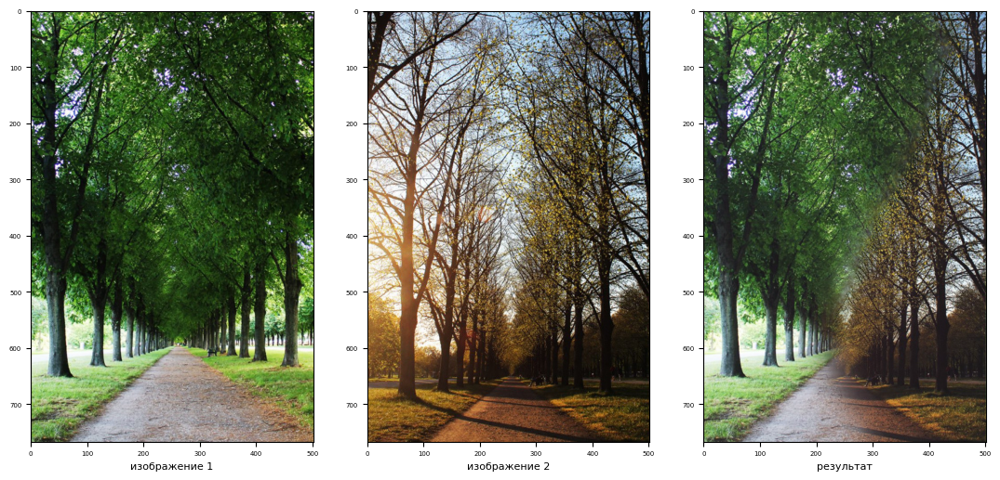

In [31]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(11, 10))
fig.tight_layout()
axes[0].imshow(summer)
axes[0].tick_params(axis='x', labelsize=5)
axes[0].tick_params(axis='y', labelsize=5)
axes[0].set_xlabel('изображение 1', fontsize=8)

axes[1].imshow(spring)
axes[1].tick_params(axis='x', labelsize=5)
axes[1].tick_params(axis='y', labelsize=5)
axes[1].set_xlabel('изображение 2', fontsize=8)

axes[2].imshow(LSrez)
axes[2].tick_params(axis='x', labelsize=5)
axes[2].tick_params(axis='y', labelsize=5)
axes[2].set_xlabel('результат', fontsize=8)


Для удобства сведём весь разобранный скрипт в одну функцию synto(path1, path2, path3). Для прослеживаемости и сравнения с вышеприведённым кодом переименовывать аналогичные переменные внутри функции не будем.

In [32]:
def synto(path1, path2, path3, sigma_seasonmask, sigma_image):
    spring = img_as_float((imread(path1)))
    summer = img_as_float((imread(path2)))
    seasonmask = img_as_float((imread(path3)))
    seasonmask = ((seasonmask>0.49).astype('float'))
    springch = [spring[:,:,i] for i in [0,1,2]]
    summerch = [summer[:,:,i] for i in [0,1,2]]
    [springch_delta_R, springch_delta_G, springch_delta_B] = [step3(springch[i], sigma_image, n_layers)[0] for i in [0,1,2]]
    [summerch_delta_R, summerch_delta_G, summerch_delta_B] = [step3(summerch[i], sigma_image, n_layers)[0] for i in [0,1,2]]
    n_layers_seasonmask = n_layers
    GM1 = np.array(step1(seasonmask, sigma_seasonmask, n_layers_mask)[0]) 
    [LA_R, LA_G, LA_B] = [np.array(i) for i in [springch_delta_R, springch_delta_G, springch_delta_B] ]
    [LB_R, LB_G, LB_B] = [np.array(i) for i in [summerch_delta_R, summerch_delta_G, summerch_delta_B] ]
    LS_R = sum(GM1*LA_R + (1-GM1)*LB_R)
    LS_G = sum(GM1*LA_G + (1-GM1)*LB_G)
    LS_B = sum(GM1*LA_B + (1-GM1)*LB_B)
    [LS_R, LS_G, LS_B] = [(i - i.min())*1 for i in [LS_R, LS_G, LS_B]]
    [LS_R, LS_G, LS_B] = [i/i.max() for i in [LS_R, LS_G, LS_B]]
    [LS_R, LS_G, LS_B] = [img_as_ubyte(i) for i in [LS_R, LS_G, LS_B]]
    LSrez = np.dstack((LS_R, LS_G, LS_B))
    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(11, 10))
    fig.tight_layout()
    axes[0].imshow(summer)
    axes[0].tick_params(axis='x', labelsize=5)
    axes[0].tick_params(axis='y', labelsize=5)
    axes[0].set_xlabel('изображение 1', fontsize=8)
    axes[1].imshow(spring)
    axes[1].tick_params(axis='x', labelsize=5)
    axes[1].tick_params(axis='y', labelsize=5)
    axes[1].set_xlabel('изображение 2', fontsize=8)
    axes[2].imshow(LSrez)
    axes[2].tick_params(axis='x', labelsize=5)
    axes[2].tick_params(axis='y', labelsize=5)
    axes[2].set_xlabel('результат', fontsize=8)

В итоге, мы построили функцию "synto", в которую передаём в виде строк адреса наших изображений на компьютере, а также сигмы размытий частотных вычетов и маски. (не забываем повернуть слэши!)
!(для получения нужного эффекта иногда нужно поменять местами первое и второе изображения, т.е. адреса в path1 и в path2)!

5. (5 баллов) Подготовьте самостоятельно три набора изображений и масок для склейки и визуализируйте результаты функции. У вас должно получиться 3 качественных и интересных коллажа.

Начнём с классики:

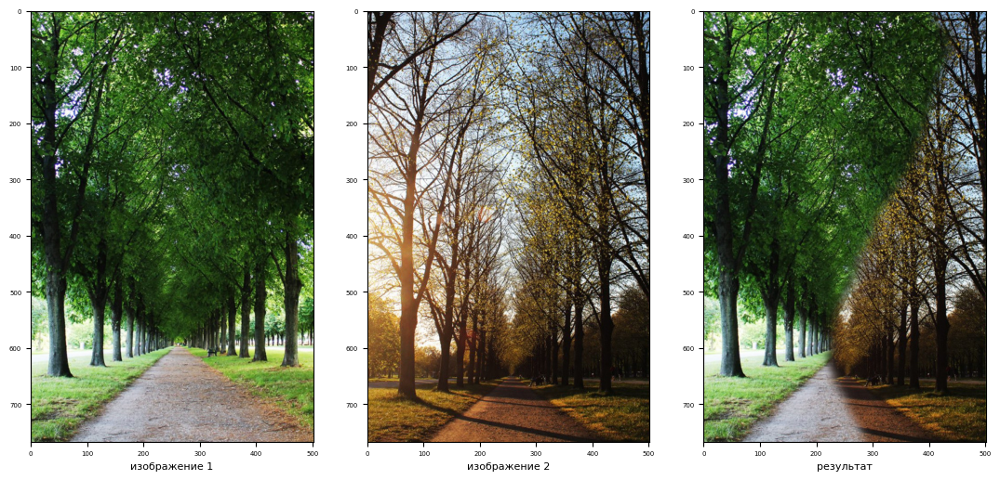

In [33]:
path1 = 'C:/Users/Drozdov/Downloads/spring.jpg'
path2 = 'C:/Users/Drozdov/Downloads/summer.jpg'
path3 = 'C:/Users/Drozdov/Downloads/seasonmask.jpg'
sigma_seasonmask = 3
sigma_image = 0.2
synto(path1, path2, path3, sigma_seasonmask, sigma_image)

Давайте сделаем из нормального Эша зловещего:

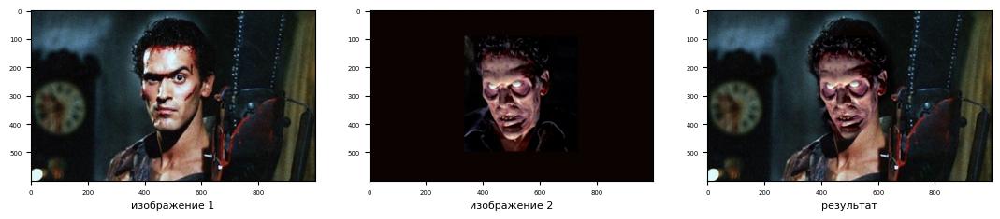

In [36]:
path1 = 'C:/Users/Drozdov/Downloads/ashev.jpg'
path2 = 'C:/Users/Drozdov/Downloads/ash.jpg'
path3 = 'C:/Users/Drozdov/Downloads/ashmask.jpg'
sigma_seasonmask = 3
sigma_image = 0.2
synto(path1, path2, path3, sigma_seasonmask, sigma_image)

А теперь терраформируем Венеру:

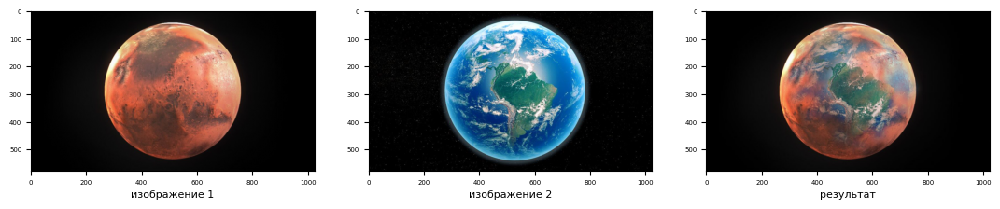

In [37]:
path1 = 'C:/Users/Drozdov/Downloads/earth.jpg'
path2 = 'C:/Users/Drozdov/Downloads/mars.jpg'
path3 = 'C:/Users/Drozdov/Downloads/planetmask.jpg'
sigma_seasonmask = 5
sigma_image = 0.2
synto(path1, path2, path3, sigma_seasonmask, sigma_image)